# An Analysis of Airbnb Listings in NYC

# 1. Introduction

In this analysis, we aim to understand the factors that influence Airbnb prices in New York City which is a highly populated city and also a popular tourist destination. We also investigate some other research questions related to trends or patterns of use when it comes to Airbnbs in this city.

<figure style="text-align: center;">
  <img src="FirstImage.jpeg", style="width:100%" alt="Image description">
  <figcaption>Image source: <a href="https://www.spinxdigital.com/blog/what-you-can-learn-from-airbnbs-successful-startup/">Spinx</a></figcaption>
</figure>

## 1.1 About the Data

We have acquired our data from multiple sources. A majority of our data is from http://insideairbnb.com/get-the-data/ and we also aquired additional data from https://trending.virginholidays.co.uk/new-york-city/attractions and https://data.cityofnewyork.us/Recreation/Parks-Properties/enfh-gkve/data. Below is the data description of our dataset.

### 1.1.1 Data Description

- id                             : Airbnb's unique identifier for the listing     
- name                           : Name of the listing
- host_id                        : Airbnb's unique identifier for the host/user
- host_name                      : Name of the host - usually just the first name(s)
- neighbourhood_group            : For certain cities like New York City, neighbourhoods might be grouped into bigger neighbourhood groups. Other cities that don't have neighbourhoods grouped like this have this column entirely blank
- neighbourhood                  : Neighbourhood names for each listing are compiled by comparing the listing's geographic coordinates with a city's definition of neighbourhoods
- latitude                       : The World Geodetic System (WGS84) projection for latitude
- longitude                      : The World Geodetic System (WGS84) projection for longtitude
- room_type                      : All homes are grouped into the following room types:
    - Entire place are best when seeking a home away from home. An entire place usually includes a bedroom, a bathroom, a kitchen, and a separate, dedicated entrance. 
    - Private rooms are great for privacy while also allowing a local connection, where you have a private room for sleeping and may share some spaces with others. 
    - Shared rooms are popular among flexible travelers looking for new friends and budget-friendly stays.
    - There are also instances where the Airbnb room type is classified as a 'hotel room'.
- price                          : Daily price in local currency
- minimum_nights                 : Minimum number of night stay for the listing
- number_of_reviews              : The number of reviews the listing has
- last_review                    : The date of the last/newest review
- reviews_per_month              : The number of reviews the listing has over the lifetime of the listing
- calculated_host_listings_count : The number of listings the host has in the current scrape, in the city/region geography
- availability_365               : the availability of the listing x days in the future as determined by the calendar. Note a listing may not be available either because it has been booked by a guest or blocked by the host.
- number_of_reviews_ltm          : The number of reviews the listing has (in the last 12 months)
- license                        : The licence/permit/registration number

### 1.1.2 Additional Data

Apart from this, we also acquired additional data via web scraping to get information on an Airbnb's nearby tourist locations. The data for the nearby parks was collected from the New York Open Data portal. This additional data was acquired to understand how much (if at all) the presence of nearby tourist spots and parks influences the prices of Airbnbs.

## 1.2 Research Questions we want to Investigate

We mainly want to investigate the prices of Airbnbs in New York City based on the various features in our dataset. The following are our specific questions:
1. How are the listings distributed in New York City across its various boroughs?
2. What is the distribution of prices of Airbnbs in New York City?
3. What inferences can we make by plotting Airbnb listing types on a map, if any? Can any peculiar pattern be explained?
4. What are the overall median prices of Airbnbs in New York City's 5 boroughs without taking into consideration any features?
5. What are the median prices of Airbnbs in New York City taking in account the different room types, nearby tourist locations, parks, reviews, etc. into consideration?
6. Which are the top 10 most expensive neighbourhoods in New York City? Which neighbourhood groups do they belong to?
7. Is there any pattern in the average pricing by the hosts that have the top 20 highest number of listings in the city?
8. What are the patterns in Airbnb names, if any?

We also want to predict Airbnb prices into 2 classes: a higher cost category, and a lower cost category, using an appropriate data modeling technique.

# 2. Data Aquisition

## 2.1 New York City Data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
dt = pd.read_csv('New York City.csv')

In [3]:
dt.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,21935608,Rental unit in New York · ★4.67 · 1 bedroom · ...,5448955,Mike,Manhattan,East Village,40.73179,-73.98679,Entire home/apt,NaN,30,15,2019-08-25,0.20,1,0,0,NaN
1,743430766348459803,Rental unit in Brooklyn · 1 bedroom · 1 bed · ...,83422715,D,Brooklyn,Flatbush,40.65375,-73.95502,Entire home/apt,289.0,30,0,NaN,NaN,1,365,0,NaN
2,22122723,Rental unit in New York · 1 bedroom · 1 bed · ...,43719554,Bersabel,Manhattan,Harlem,40.82440,-73.94598,Private room,NaN,30,0,NaN,NaN,1,0,0,NaN
3,22434861,Rental unit in Brooklyn · 3 bedrooms · 4 beds ...,5925222,Sophia,Brooklyn,Bushwick,40.69020,-73.91782,Entire home/apt,NaN,30,1,2018-01-01,0.01,1,0,0,NaN
4,35713272,Rental unit in New York · 1 bedroom · 1 bed · ...,268631641,Harris,Manhattan,East Village,40.72385,-73.97695,Private room,NaN,30,1,2019-06-20,0.02,1,0,0,NaN


In [4]:
dt.shape

(39719, 18)

## 2.2 Additional Data

### 2.2.1 NYC Tourist Locations Data

We collect the top 50 popular tourist locations in New York City. We only collect the popular tourist locations because these are more likely to have an effect on pricing of nearby Airbnb listings as compared to those locations which are less visited by tourists. This data is collected by scrapping the website https://trending.virginholidays.co.uk/new-york-city/attractions.

In [5]:
import requests
from bs4 import BeautifulSoup

url = "https://trending.virginholidays.co.uk/new-york-city/attractions"
response = requests.get(url)
soup = BeautifulSoup(response.content, 'html.parser')
Places = [h3.text for h3 in soup.find_all('h3', class_='place__name')]

We get all the neighbourhoods of Airbnb listings from our main data and list the number of these tourist locations which fall in those neighbourhoods. 

In [6]:
import pandas as pd
list1 = pd.read_excel('Tourist attraction count by neighborhood.xlsx')

In [7]:
list1.head(8)

,neighbourhood,Tourist Location
0,Allerton,0
1,Arden Heights,0
2,Arrochar,0
3,Arverne,0
4,Astoria,1
5,Bath Beach,0
6,Battery Park City,3
7,Bay Ridge,0


We then merge this new column to our dataset. 

In [8]:
merged_data1 = dt.merge(list1, how='left', on='neighbourhood')

### 2.2.2 Parks Data

The data for the parks was collected from the New York Open Data Portal from https://data.cityofnewyork.us/Recreation/Parks-Properties/enfh-gkve/data using the API endpoint

In [9]:
response = requests.get("https://data.cityofnewyork.us/resource/enfh-gkve.json")
data = response.json()
parkdata = pd.DataFrame(data)

We get all the neighbourhoods of Airbnb listings from our main data and list the number of these parks which fall in those neighbourhoods. This way for each neighbourhood, we get the number of parks which lie in them.

In [10]:
list2 = pd.read_excel('Park count by neighborhood.xlsx')

In [11]:
list2.head(5)

,neighbourhood,NumberofParks
0,Allerton,3
1,Baychester,1
2,Belmont,9
3,Bronxdale,0
4,Castle Hill,3


We now merge this with our main data:

In [12]:
data = merged_data1.merge(list2, how='left', on= 'neighbourhood')

Now we have a final data which contains number of tourist location and parks in each of the neighbourhoods of Airbnb Listings.

In [13]:
data[['neighbourhood','Tourist Location','NumberofParks']]

,neighbourhood,Tourist Location,NumberofParks
0,East Village,0,NaN
1,Flatbush,1,5.0
2,Harlem,1,141.0
3,Bushwick,0,13.0
4,East Village,0,NaN
...,...,...,...
39714,Greenwich Village,1,21.0
39715,Hell's Kitchen,1,1.0
39716,West Village,0,1.0
39717,Chinatown,1,2.0


# 3. Data Cleaning and Preparation

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39719 entries, 0 to 39718
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              39719 non-null  int64  
 1   name                            39719 non-null  object 
 2   host_id                         39719 non-null  int64  
 3   host_name                       39714 non-null  object 
 4   neighbourhood_group             39719 non-null  object 
 5   neighbourhood                   39719 non-null  object 
 6   latitude                        39719 non-null  float64
 7   longitude                       39719 non-null  float64
 8   room_type                       39719 non-null  object 
 9   price                           29091 non-null  float64
 10  minimum_nights                  39719 non-null  int64  
 11  number_of_reviews               39719 non-null  int64  
 12  last_review                     

We can see that name, host_name, neighbourhood_group, neighbourhood, room_type, last_review and license fall into categorical variable category, while host_id, latitude, longitude, price, minimum_nights, number_of_reviews, reviews_per_month, calculated_host_listings_count, availability_365 and number_of_reviews_ltm are numerical variables

## 3.1 Dropping Duplicate Rows

In [15]:
df = data.drop_duplicates()
df.shape

(39719, 20)

This means there are no duplicate rows in our dataset.

## 3.2 Treating Missing Values

In [16]:
data.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                             5
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                             10628
minimum_nights                        0
number_of_reviews                     0
last_review                       11543
reviews_per_month                 11543
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
license                           35027
Tourist Location                      0
NumberofParks                      1098
dtype: int64

Since the license column consists mainly of null values, we decide to drop it from the dataset.  

In [17]:
data = data.drop(['license'],axis=1)

We fill the missing values in number of parks to zero. The columns host_name and last_review also contain many null values; since these are of object datatype, we cannot suitably approximate them using measures of central tendency or any other method

In [18]:
data['NumberofParks'].fillna(0, inplace=True)
data['host_name'].fillna('No name',inplace=True)
data['last_review'].fillna('Unknown',inplace=True)

The reviews_per_month column contains a large number of null values, too. Let us investigate further.

In [19]:
data[(data['number_of_reviews'] == 0) & (data['reviews_per_month'].isna())].shape

(11543, 19)

This indicates that values in the reviews_per_month column are null only when the number of reviews for that AirBnb is 0; thus, we can set these values to 0 as there are no reviews present for that AirBnb.

In [20]:
data['reviews_per_month'] = data['reviews_per_month'].fillna(0)

We note that there are 10628 missing values in the prices column - we need to treat these suitably.

In [21]:
df = data.copy() 
df = df.dropna(subset=['price']) #temporary DataFrame without NAN price values

We group our values according to both neighbourhood and the room type within that neighbourhood, and then compute the median price for each combination.

In [22]:
med_prices = df.groupby(['neighbourhood', 'room_type']).agg(room_types=('room_type', 'unique'),median_price=('price', 'median')).reset_index()
med_prices.isna().sum()

neighbourhood    0
room_type        0
room_types       0
median_price     0
dtype: int64

In [23]:
tmp = med_prices.sort_values(by='median_price',ascending=True)
tmp

,neighbourhood,room_type,room_types,median_price
219,Gramercy,Shared room,[Shared room],24.0
118,Concourse,Shared room,[Shared room],27.0
298,Little Neck,Shared room,[Shared room],27.0
338,Morris Heights,Shared room,[Shared room],27.5
335,Morningside Heights,Shared room,[Shared room],30.0
...,...,...,...,...
15,Battery Park City,Private room,[Private room],555.0
206,Fort Wadsworth,Entire home/apt,[Entire home/apt],600.0
446,SoHo,Private room,[Private room],655.0
359,New Brighton,Entire home/apt,[Entire home/apt],660.5


Thus, the median prices for all combinations of neighbourhood and room types within that neighbourhood have been computed. Now we impute the missing price values with these median prices.

In [24]:
data = data.merge(med_prices[['neighbourhood', 'room_type', 'median_price']], 
                     how='left', 
                     on=['neighbourhood', 'room_type'], 
                     suffixes=('_data', '_median'))

data['price'] = data.apply(lambda row: row['median_price'] if pd.isna(row['price']) else row['price'], axis=1)
data = data.drop(columns=['median_price'])

In [25]:
data.isnull().sum()

id                                 0
name                               0
host_id                            0
host_name                          0
neighbourhood_group                0
neighbourhood                      0
latitude                           0
longitude                          0
room_type                          0
price                             12
minimum_nights                     0
number_of_reviews                  0
last_review                        0
reviews_per_month                  0
calculated_host_listings_count     0
availability_365                   0
number_of_reviews_ltm              0
Tourist Location                   0
NumberofParks                      0
dtype: int64

The above indicates that our data contains 12 such combinations of neighbourhood and room type for which there is no price data available. Since we cannot approximate these values, and since it is a very small amount of missing data, we decide to drop these rows.

In [26]:
data_cleaned = data.dropna(subset=['price'])
data_cleaned.isnull().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
Tourist Location                  0
NumberofParks                     0
dtype: int64

In [27]:
data_cleaned.shape

(39707, 19)

We have successfully dealt with missing values in our data.

## 3.3 Treating Outliers

In [28]:
data_cleaned.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,Tourist Location,NumberofParks
count,3.970700e+04,3.970700e+04,39707.000000,39707.000000,39707.000000,39707.000000,39707.000000,39707.000000,39707.000000,39707.000000,39707.000000,39707.000000,39707.000000
mean,3.170164e+17,1.618216e+08,40.729268,-73.946334,193.676468,29.794495,25.215101,0.706650,43.039640,154.684967,5.834714,1.199310,19.526129
std,4.116352e+17,1.733936e+08,0.056341,0.054539,811.797604,29.887963,58.121576,1.511868,128.702141,148.110716,16.403649,2.043874,30.259535
min,2.595000e+03,1.678000e+03,40.500314,-74.251907,10.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2.040641e+07,1.701460e+07,40.688998,-73.982890,79.500000,30.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000
50%,4.679704e+07,8.089403e+07,40.726350,-73.954230,133.000000,30.000000,4.000000,0.140000,1.000000,119.000000,0.000000,0.000000,11.000000
75%,7.665961e+17,2.918764e+08,40.762610,-73.926820,200.000000,30.000000,22.000000,0.830000,7.000000,315.000000,4.000000,1.000000,22.000000
max,1.061633e+18,5.539914e+08,40.911380,-73.713650,100000.000000,1250.000000,1865.000000,75.490000,713.000000,365.000000,1075.000000,8.000000,141.000000


As we can see, the maximum value in the price column is $100000 which can affect our data modeling greatly, especially because this column indicates the daily price of an AirBnb room and such a high price for a single night is unlikely and/or rare.

The maximum number of minimum nights too is quite high as compared to the mean number of minimum nights and the median number of minimum nights, suggesting the presence of outliers.

We decide to use the method of IQR to drop the rows containing outliers.

<Axes: xlabel='price'>

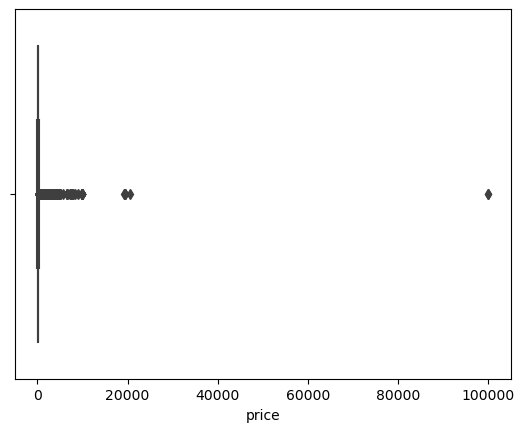

In [29]:
sns.boxplot(x=data_cleaned['price']) #plotting the original boxplot

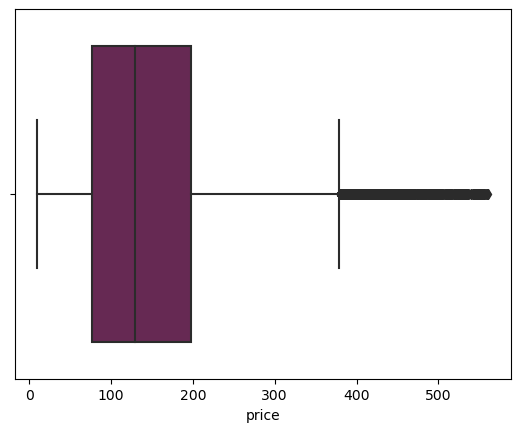

In [30]:
from scipy.stats import iqr

my_iqr = iqr(data_cleaned['price'])
    
lower_bound = data_cleaned['price'].quantile(0.25) - 3 * my_iqr
upper_bound = data_cleaned['price'].quantile(0.75) + 3 * my_iqr
mydata = data_cleaned[(data_cleaned['price'] >= lower_bound) & (data_cleaned['price'] <= upper_bound)] #filtering out the outliers

sns.boxplot(x=mydata['price'], color='#701f57')

plt.show() 

Thus, we have removed most of the outliers from our data but some remain. These remaining high prices can still be genuine, so we leave them in the data to prevent loss of information.

In [31]:
mydata.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,Tourist Location,NumberofParks
count,3.833700e+04,3.833700e+04,38337.000000,38337.000000,38337.000000,38337.000000,38337.000000,38337.000000,38337.000000,38337.000000,38337.000000,38337.000000,38337.000000
mean,3.095762e+17,1.591333e+08,40.729061,-73.945265,147.592861,30.079323,25.658711,0.716749,42.780369,152.052951,5.939667,1.155802,19.849362
std,4.087348e+17,1.718502e+08,0.056811,0.054756,93.294284,29.941697,58.736446,1.528344,129.510532,147.665196,16.618657,1.987232,30.491479
min,2.595000e+03,1.678000e+03,40.500314,-74.251907,10.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,1.998188e+07,1.651418e+07,40.688540,-73.982194,77.000000,30.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000
50%,4.631413e+07,7.732501e+07,40.725930,-73.953390,129.000000,30.000000,4.000000,0.150000,1.000000,109.000000,0.000000,0.000000,11.000000
75%,7.570335e+17,2.830575e+08,40.762790,-73.925720,198.000000,30.000000,23.000000,0.840000,6.000000,310.000000,4.000000,1.000000,22.000000
max,1.061633e+18,5.539914e+08,40.911380,-73.713650,561.000000,1250.000000,1865.000000,75.490000,713.000000,365.000000,1075.000000,8.000000,141.000000


In [32]:
mydata.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,Tourist Location,NumberofParks
0,21935608,Rental unit in New York · ★4.67 · 1 bedroom · ...,5448955,Mike,Manhattan,East Village,40.73179,-73.98679,Entire home/apt,200.0,30,15,2019-08-25,0.20,1,0,0,0,0.0
1,743430766348459803,Rental unit in Brooklyn · 1 bedroom · 1 bed · ...,83422715,D,Brooklyn,Flatbush,40.65375,-73.95502,Entire home/apt,289.0,30,0,Unknown,0.00,1,365,0,1,5.0
2,22122723,Rental unit in New York · 1 bedroom · 1 bed · ...,43719554,Bersabel,Manhattan,Harlem,40.82440,-73.94598,Private room,75.0,30,0,Unknown,0.00,1,0,0,1,141.0
3,22434861,Rental unit in Brooklyn · 3 bedrooms · 4 beds ...,5925222,Sophia,Brooklyn,Bushwick,40.69020,-73.91782,Entire home/apt,158.0,30,1,2018-01-01,0.01,1,0,0,0,13.0
4,35713272,Rental unit in New York · 1 bedroom · 1 bed · ...,268631641,Harris,Manhattan,East Village,40.72385,-73.97695,Private room,97.0,30,1,2019-06-20,0.02,1,0,0,0,0.0


In [33]:
mydata.shape

(38337, 19)

This is our cleaned dataset. We may now perform further analysis to draw detailed insights from our data.

# 4. Data Visualization

For our visualisations, we decide to use a common colour theme. This ensures uniformity and is visually appealing when interpreting charts.

In [34]:
palette = sns.color_palette("rocket")
palette.as_hex()

['#35193e', '#701f57', '#ad1759', '#e13342', '#f37651', '#f6b48f']

Let us get the hexadecimal codes of these colours, as we will require them for certain simple plots.

In [35]:
l = []
for i in range(6):
    l += ([palette.as_hex()[i]])
l

['#35193e', '#701f57', '#ad1759', '#e13342', '#f37651', '#f6b48f']

## 4.1 Correlation Heatmap

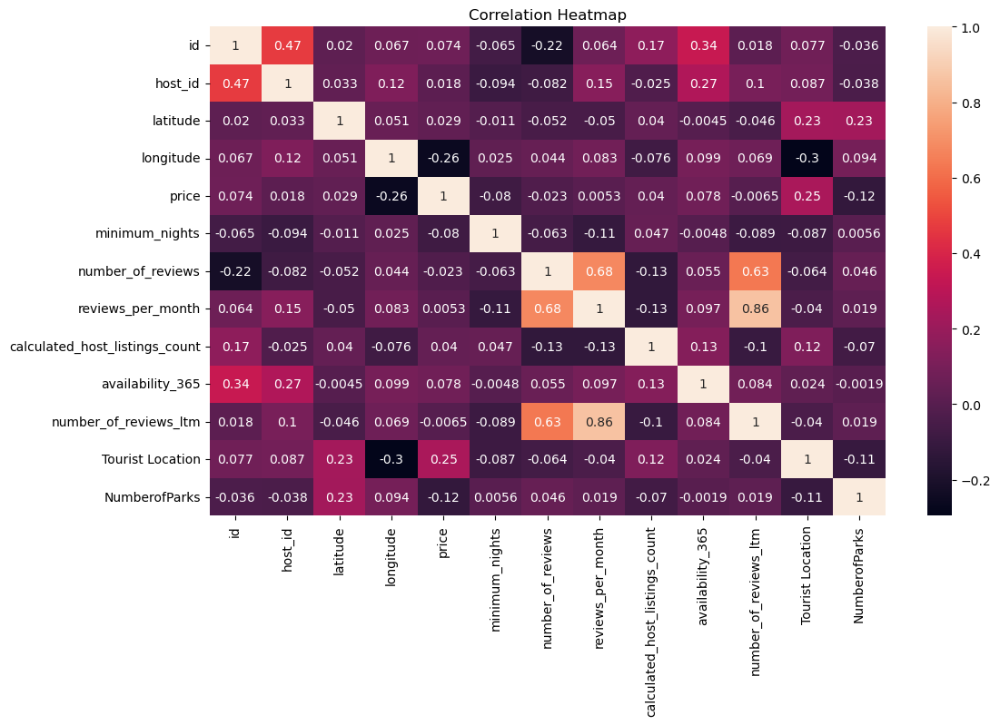

In [36]:
correlation_matrix = mydata.corr()
plt.figure(figsize=(12, 7))
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Heatmap')
plt.show()

The columns regarding IDs are correlated and so are the review columns, which is expected. Our remaining columns are not correlated.

## 4.2 Investigating Number of Listings

### 4.2.1 Number of listings in each neighbourhood group i.e. borough

New York City has 5 neighbourhood groups (called boroughs) within which are smaller neighbourhoods. We will first broadly see the number of Airbnb listings in each group.

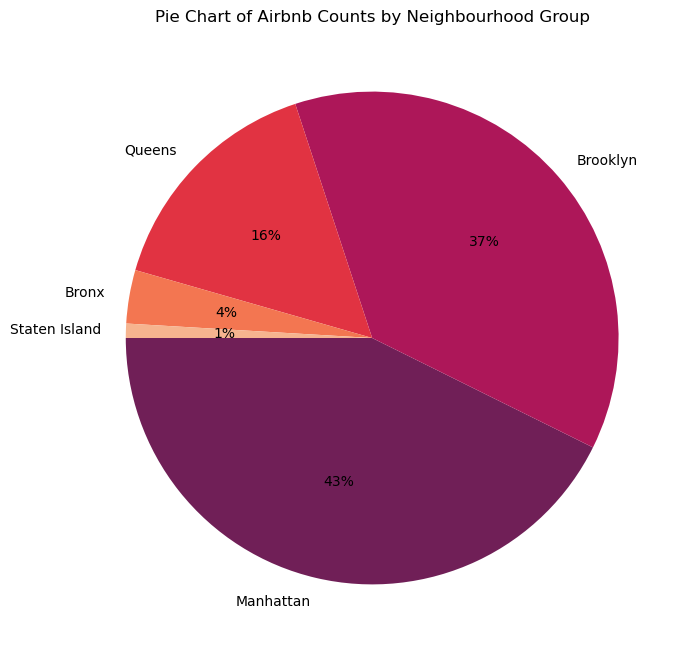

In [37]:
neighborhood_counts = mydata['neighbourhood_group'].value_counts()
plt.figure(figsize=(12, 8))
plt.pie(neighborhood_counts, labels=neighborhood_counts.index, startangle=180, autopct='%1.f%%', colors=palette.as_hex()[1:6])
plt.title('Pie Chart of Airbnb Counts by Neighbourhood Group')
plt.show()

The maximum number of listing are in Manhattan, followed by Brooklyn. These two neighbourhood groups also account for about 80% of all Airbnb listings in New York City! 

### 4.2.2 Number of Listings by the room type in each neighbourhood group

We can now check for number of listings in each neighbourhood group by the type of room it is.

**Please note:** All the interactive charts made via Plotly's graph objects print the plots on top of each other by default upon running the code for the first time. The interactive plots can be seen and interpreted clearly once one of the buttons is pressed.

In [38]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

neighborhood_groups = mydata['neighbourhood_group'].unique()
fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'pie'}]])
visible_list = [False] * len(neighborhood_groups)

colors = ['#701f57', '#ad1759', '#e13342', '#f37651']

for i, neighborhood_group in enumerate(neighborhood_groups):
    data_subset = mydata[mydata['neighbourhood_group'] == neighborhood_group]
    room_type_counts = data_subset['room_type'].value_counts()
    labels = room_type_counts.index
    values = room_type_counts.values
    fig.add_trace(go.Pie(labels=labels, values=values, textinfo='label+percent', 
                         marker=dict(colors=colors), showlegend=False), row=1, col=1)

visible_list[0] = True  
updatemenus = [{'type': 'buttons', 'showactive': True, 'buttons': []}]
for i, neighborhood_group in enumerate(neighborhood_groups):
    button = dict(label=neighborhood_group, method='update', 
                  args=[{'visible': [i == j for j in range(len(neighborhood_groups))]},
                        {'title': f'Pie Chart of Room Types in {neighborhood_group}'}])
    updatemenus[0]['buttons'].append(button)

fig.update_layout(updatemenus=updatemenus, title='Pie Chart of Room Types by Neighbourhood Group')
fig.show()

Upon clicking the buttons to see the number of listings for each room type in the different boroughs, we infer:
- A majority of the Airbnb properties in Manhattan and Staten Island are entire home/apartments; whereas in the remaining 3 neighbourhood groups, the majority is a private room.
- Manhattan, Brooklyn and Queens have hotel rooms, but in each of the boroughs this room type accounts for less than 1% of the total listings.
- The proportion of shared rooms is quite less in all the neighbourhood groups, being less than 2% in all except Queens where it is 2.08%.

Let us take a look at this distribution of the various property types on a map.

In [39]:
import plotly.express as px

rocket_colors = ['#35193e', '#701f57', '#ad1759','#e13342']

fig = px.scatter_mapbox(mydata, lat='latitude', lon='longitude', color='room_type', mapbox_style='carto-positron',
                        zoom=9, title='Distribution of Property Types', color_discrete_sequence=rocket_colors, text= mydata['neighbourhood_group'])

fig.update_layout(mapbox_layers=[{'sourcetype': 'geojson', 'source': 'Borough Boundaries.geojson',
                                  'type': 'line', 'color': 'black', 'line': {'width': 1}, 'opacity': 0.9,},],
                  legend=dict(traceorder='reversed'),  title_x = 0.45)
fig.show()

Upon clicking on the buttons of the room types, we can see the distribution of the various property types on the map and draw the following inferences:

- We see that almost all the hotel rooms are listed in Manhattan borough and that Bronx and Staten Island have no hotel rooms at all - just as we inferred from the pie charts.
- Shared rooms, as we had noted, are few in each of the boroughs and also widely scattered apart across the geography.
- Manhattan seems to have Airbnbs listed nearly everywhere in the borough, whereas Staten Island has very few properties, most of which are scattered towards the north-east part of the borough.
- We notice that most properties in Staten Island seem to be in the north-east part; we can reason that this could be due to this area being closer to other boroughs of New York city hence lowering the commuting distance.
- We notice that hotel rooms also are concentrated in the south side of Manhattan. One reasoning is that there could be many tourist locations present here - let us see if this assumption holds.

In [40]:
fig = px.scatter_mapbox(mydata[mydata['neighbourhood_group']=='Manhattan'], lat='latitude', lon='longitude', color='Tourist Location', mapbox_style='carto-positron',
                        zoom=11, title='Distribution of Tourist Locations in Manhattan', text=mydata[mydata['neighbourhood_group']=='Manhattan']['neighbourhood_group'])

fig.update_layout(mapbox_layers=[{'sourcetype': 'geojson', 'source': 'Borough Boundaries.geojson',
                                  'type': 'line', 'color': 'black', 'line': {'width': 1}, 'opacity': 0.9,},],
                  legend=dict(traceorder='reversed'),  title_x = 0.45)
fig.show()

Indeed, in the location where we see most of the hotel rooms concentrated, there are a maximum number of tourist spots located. This supports our earlier reasoning regarding the hotel rooms.

## 4.3 Investigating Prices

### 4.3.1. Plotting the Distribution of Airbnb Prices

Text(0.5, 1.0, 'Distribution of Airbnb Prices in NYC')

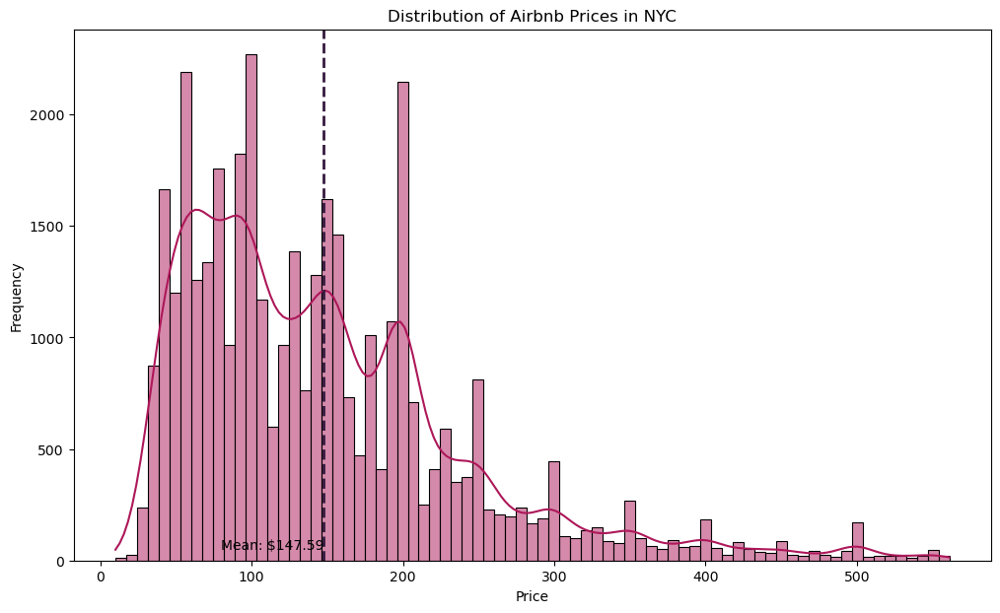

In [41]:
mean_price = mydata['price'].mean()

plt.figure(figsize=(12, 7))
sns.histplot(mydata['price'], color='#ad1759', kde=True)
plt.axvline(mydata['price'].mean(), color='#35193e', linestyle='dashed', linewidth=2, label='Mean Price')
plt.text(mean_price, 50, f'Mean: ${mean_price:.2f}', ha='right')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.title('Distribution of Airbnb Prices in NYC')

We observe that a high number of listings seem to be priced between 50 to 100 dollars, with fewer listings being very expensive, over 200 dollars per night. The mean price of an AirBnb in New York City is 147.59 dollars.

### 4.3.2 Average Prices by the type of room

We plot both the mean as well as the median prices by type of room.

Text(0, 0.5, 'Price')

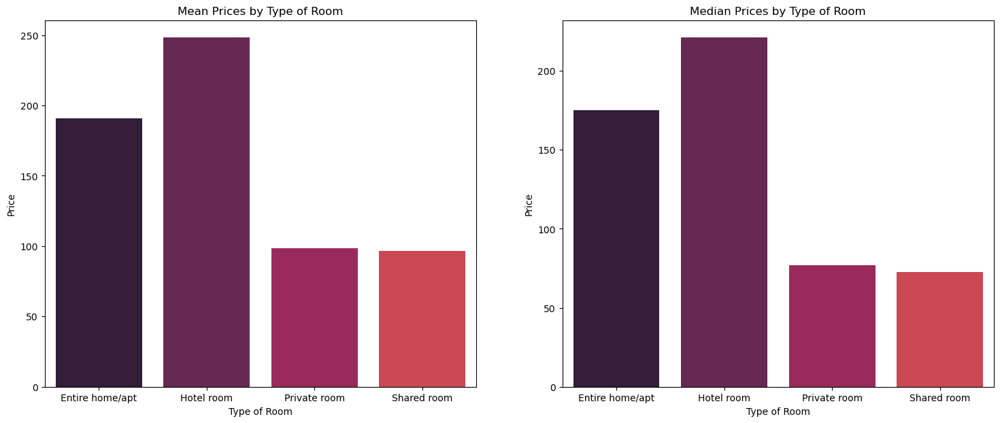

In [42]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 7))

mean_prices = mydata.groupby('room_type')['price'].mean().reset_index()
median_prices = mydata.groupby('room_type')['price'].median().reset_index()

sns.barplot(x='room_type', y='price', data=mean_prices, palette=palette, ax=axes[0])
axes[0].set_title('Mean Prices by Type of Room')
axes[0].set_xlabel('Type of Room')
axes[0].set_ylabel('Price')

sns.barplot(x='room_type', y='price', data=median_prices, palette=palette, ax=axes[1])
axes[1].set_title('Median Prices by Type of Room')
axes[1].set_xlabel('Type of Room')
axes[1].set_ylabel('Price')

Hotel rooms are the most expensive, even more so than booking an entire home or apartment. Then we have entire homes/apartments being the second most expensive, followed by private rooms and finally shared rooms being slightly cheaper. This follows intuition, that shared rooms should indeed be the cheapest on average.

### 4.3.3 Pricing for each room type in all the neighbourhood groups

First, let us take a look at the overall median price just by the neighbourhood group.

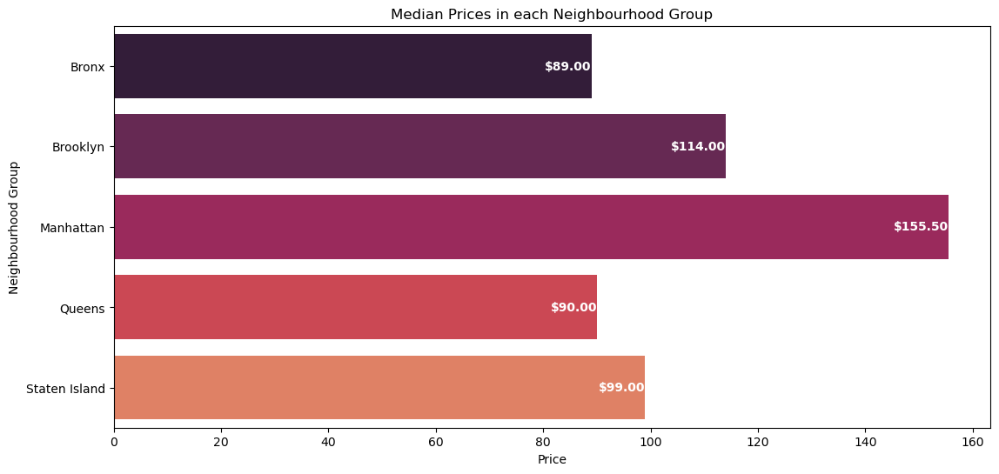

In [43]:
median_prices = mydata.groupby('neighbourhood_group')['price'].median().reset_index()

plt.figure(figsize=(13, 6))
mybar = sns.barplot(x='price', y='neighbourhood_group', data=median_prices, palette=palette)
for index, value in enumerate(median_prices['price']):
    mybar.text(value, index, f'${value:.2f}', ha='right', va='center', color='white', fontweight='bold')
plt.title('Median Prices in each Neighbourhood Group')
plt.xlabel('Price')
plt.ylabel('Neighbourhood Group')
plt.show()

Overall, Manhattan has the highest median cost of booking an Airbnb whereas Bronx has the lowest. However, prices can differ significantly by room types and therefore, we must conduct a deeper analysis into the average price of each room type, in each borough.

In [44]:
median_prices = mydata.groupby(['neighbourhood_group', 'room_type'])['price'].median().reset_index()
median_prices

,neighbourhood_group,room_type,price
0,Bronx,Entire home/apt,120.0
1,Bronx,Private room,65.0
2,Bronx,Shared room,67.5
3,Brooklyn,Entire home/apt,170.0
4,Brooklyn,Hotel room,172.0
5,Brooklyn,Private room,67.5
6,Brooklyn,Shared room,65.0
7,Manhattan,Entire home/apt,191.0
8,Manhattan,Hotel room,234.5
9,Manhattan,Private room,99.0


Bronx and Staten Island don't have any hotel rooms listed, as we noticed before from the map. So, we add these rows to the dataframe with the value 0 for the median price.

In [45]:
new_rows = [{'neighbourhood_group': 'Bronx', 'room_type': 'Hotel room', 'price': 0},
            {'neighbourhood_group': 'Staten Island', 'room_type': 'Hotel room', 'price': 0}]
median_prices = median_prices.append(new_rows, ignore_index=True)

In [46]:
myfig = px.bar(median_prices, x='room_type', y='price', color='room_type', animation_frame='neighbourhood_group',text='price', 
             labels={'neighbourhood_group': 'Neighbourhood Group', 'price': 'Median Price'},
             title='Median Prices by Room Type in each Neighbourhood Group',
             color_discrete_sequence=rocket_colors, range_y=[0, 250])

#Customising the hover text for each of the bars
custom_hovertemplate = '$%{y:.2f}'
myfig.update_traces(hovertemplate=custom_hovertemplate)
for frame in myfig.frames:
    for trace in frame.data:
        trace.hovertemplate = custom_hovertemplate
        
myfig.update_layout(title_x=0.45)
myfig.show()

We make the following inferences:
- Hotel rooms, if they exist in the borough, have the highest median price.
- The second highest median price is that for an entire home or apartment for all boroughs except Staten Island, in which a shared room costs more. 
- When we compare the median prices of just the shared room type in each borough, it is a lot higher in Staten Island as compared to the rest of the boroughs where it either costs less than a private room or approximately the same. Hence, this difference in pricing in Staten Island can be considered as an exception.

Let us plot the minimum and maximum prices instead of the median prices to get deeper insights.

In [47]:
minmax_prices = mydata.groupby(['neighbourhood_group', 'room_type'])['price'].agg(['min', 'max']).reset_index()
new_rows = [{'neighbourhood_group': 'Bronx', 'room_type': 'Hotel room', 'min': 0, 'max': 0},
            {'neighbourhood_group': 'Staten Island', 'room_type': 'Hotel room', 'min': 0, 'max': 0}]
minmax_prices = minmax_prices.append(new_rows, ignore_index=True)

In [48]:
myfig2 = px.bar(minmax_prices, x='room_type', y=['min', 'max'],
             color='room_type', animation_frame='neighbourhood_group',
             labels={'neighbourhood_group': 'Neighbourhood Group', 'value': 'Price'},
             title='Minimum and Maximum Prices by Room Type in each Neighbourhood Group',
             color_discrete_sequence=rocket_colors, range_y=[0, 650])

custom_hovertemplate = '$%{y:.2f}'
myfig2.update_traces(hovertemplate=custom_hovertemplate)
for frame in myfig2.frames:
    for trace in frame.data:
        trace.hovertemplate = custom_hovertemplate

myfig2.update_layout(title_x=0.45)
myfig2.show()

The bars are stacked and show the minimum and maximum prices of each room type in different neighbourhood groups.

We make the following inferences:
- Now, we can clearly see that hotel rooms have a very high minimum price as compared to all the other room types.
- The maximum cost is the highest across all boroughs for an entire home or apartment.
- We also discover that the reason why median price in Staten Island is so high is because the minimum price of a shared room in this borough is much higher as compared to that in all other boroughs. It is also higher than the minimum price of the other room types in the borough, but its maximum price is lower in comparison. This is why we have the exception we discovered earlier for Staten Island.

### 4.3.4 Top 10 Costliest Neighbourhoods for Airbnbs

Let us see what the median prices are in the top 10 most expensive neighbourhoods in New York City by making an interactive gauge chart. We can click on the buttons of the different neighbourhoods to get the median price displayed in the chart.

In [49]:
neighbourhood_prices = mydata[['neighbourhood', 'price']]
avg = neighbourhood_prices.groupby('neighbourhood')['price'].median()
top10 = avg.nlargest(10).index.tolist()

fig = px.scatter_mapbox(mydata[mydata['neighbourhood'].isin(top10)], lat='latitude', lon='longitude', color='Tourist Location', mapbox_style='carto-positron',
                        zoom=9, title='Distribution of Tourist Locations in Manhattan', text=mydata[mydata['neighbourhood'].isin(top10)]['neighbourhood'])

fig.update_layout(mapbox_layers=[{'sourcetype': 'geojson', 'source': 'Borough Boundaries.geojson',
                                  'type': 'line', 'color': 'black', 'line': {'width': 1}, 'opacity': 0.9,},],
                  legend=dict(traceorder='reversed'),  title_x = 0.45)
fig.show()

As we can see, among the top 10 neighbourhoods which have the costliest Airbnb listings, 5 of them are in Manhattan, 2 in Brooklyn, 2 in Staten Island and 1 in Queens. Bronx doesn't have any of the top 10 costliest neighbourhoods, and as we had noticed earlier from our horizontal barplot, Bronx also has the lowest overall median cost of an Airbnb property.

In [50]:
fig = go.Figure()
for name in top10:
    fig.add_trace(go.Indicator(mode="gauge+number", value=avg.loc[name], title={'text': f'{name}'},
                  domain={'x': [0, 1], 'y': [0, 1]}, 
                  gauge={'axis': {'range': [None, 400]},'bar': {'color': '#701f57'},
                         'steps': [{'range': [0, 400], 'color': '#ad1759'}]}, 
                  number={'prefix': '$'}))

fig.update_layout(title_text='Top 10 Costliest Neighborhoods by Median Price', title_x = 0.55, title_y = 0.1, showlegend=True,
                  updatemenus=[dict(type='buttons', buttons=[dict(label=name, method='update',
                  args=[{'visible': [True if n == name else False for n in top10]}]) for name in top10],)])
fig.show()

Inferences:
- NoHo, Tribeca and Grymes Hill are the neighbourhoods with the highest median price for booking an Airbnb.
- NoHo is the neighbourhood with the highest median price for booking an Airbnb, at 354.5 dollars being the median cost. It is the only neighbourhood with a median cost over 350 dollars.
- Grymes Hill and Neponsit have the same median cost for booking a property (295 dollars).
- We also notice that Cobble Hill, Lighthouse Hill, Theater District and West Village have the same median cost (250 dollars).
- Thus, all of the top 10 costliest neighbourhoos have a median price of 250 dollars and more.

## 4.4 Investigating Hosts

### 4.4.1 Hosts with the highest number of listings

Let us take a look at the number of unique Airbnb hosts in New York City.

In [51]:
listings = mydata.groupby('host_id').size().reset_index(name='total_listings')
listings.shape

(23467, 2)

This means that there are more than 23 thousand unique hosts who operate Airbnbs. Let us see the top 20 hosts who have the maximum number of listings in the city.

In [52]:
sorted_hosts = listings.sort_values(by='total_listings', ascending=False)
top20 = sorted_hosts.head(20)

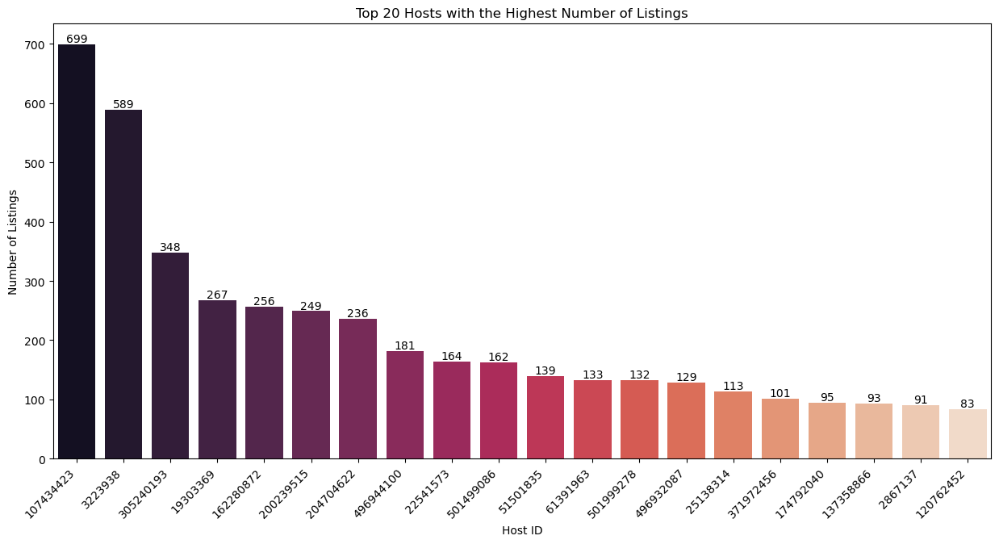

In [53]:
plt.figure(figsize=(15, 7))
mybar = sns.barplot(x='host_id', y='total_listings', data=top20, palette='rocket', order=top20['host_id'])
plt.title('Top 20 Hosts with the Highest Number of Listings')
plt.xlabel('Host ID')
mybar.set_xticklabels(mybar.get_xticklabels(), rotation=45, ha='right')
plt.ylabel('Number of Listings')
for p in mybar.patches:
    mybar.annotate(f'{p.get_height():.0f}', (p.get_x()+p.get_width()/2, p.get_height()), 
                   ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.show()

The top two hosts have a large number of listings, 699 and 589 respectively, followed by the third who has 348 listings - a significantly lower number. By the 20th, the host has 83 listings, much less than the 300+ properties that the top 3 have. 

There are more than 23 thousand unique hosts, as we saw before. This suggests a high concentration of rental properties in the hands of a small number of hosts.

### 4.4.2 Pricing for Airbnb properties from these top 20 hosts

Let us see how much these top 20 hosts charge for their property on average. (The order of the hosts in the chart below is same as the order of the hosts in the above chart; this was deliberately done to ensure quick interpretability)

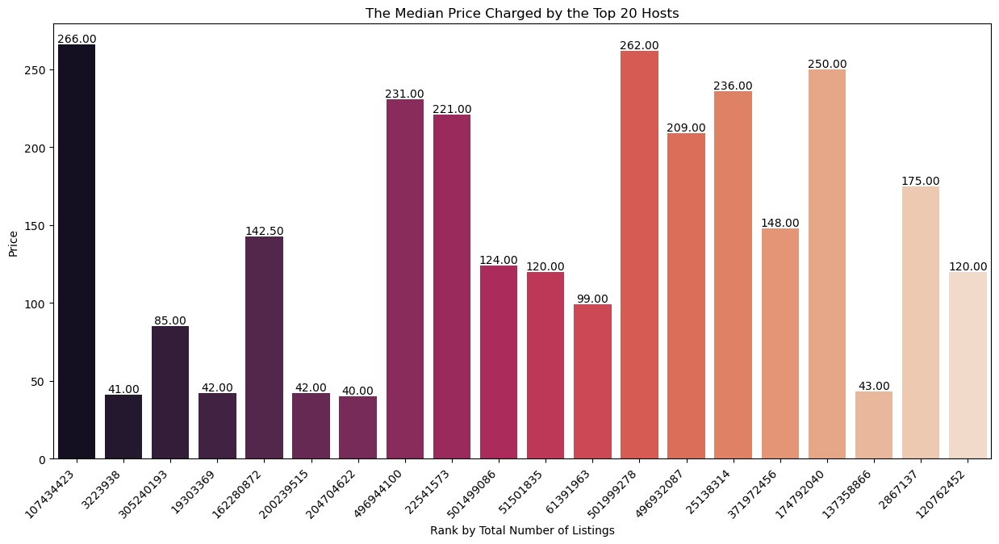

In [54]:
top20_host_ids = top20['host_id']
top20_data = mydata[mydata['host_id'].isin(top20_host_ids)]
avg = top20_data.groupby('host_id')['price'].median().reset_index(name='med_price')
order = top20['host_id'].tolist()

plt.figure(figsize=(15, 7))
mybar = sns.barplot(x='host_id', y='med_price', data=avg, palette='rocket', order=order)
plt.title('The Median Price Charged by the Top 20 Hosts')
plt.xlabel('Rank by Total Number of Listings')
mybar.set_xticklabels(mybar.get_xticklabels(), rotation=45, ha='right')
plt.ylabel('Price')
for p in mybar.patches:
    mybar.annotate(f'{p.get_height():.2f}', (p.get_x()+p.get_width()/2, p.get_height()), 
                   ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.show()

The host with 626 listings charge the most on average for their Airbnb properties. This may mean that due to having a diverse portfolio they possibly offer many premium or unique accommodations which charge more, thus driving the median price much higher.

Other than this, in general it seems the hosts with a higher number of listings charge less on average and have affordable prices as compared to those with fewer number of listings. This suggests that they may have many budget-friendly options.

We notice:
- Among the top 10 hosts who have the highest number of listings, five have the median price of their properties below 100 dollars, out of which four have the median price below 50 dollars. 
- Among the remaining 11 to 20, only two hosts have the median price of their properties below 100 dollars, and only one has it below 50 dollars.

## 4.5 Investigating the other features in our data

### 4.5.1 Median prices by the number of tourist locations in the neighbourhood

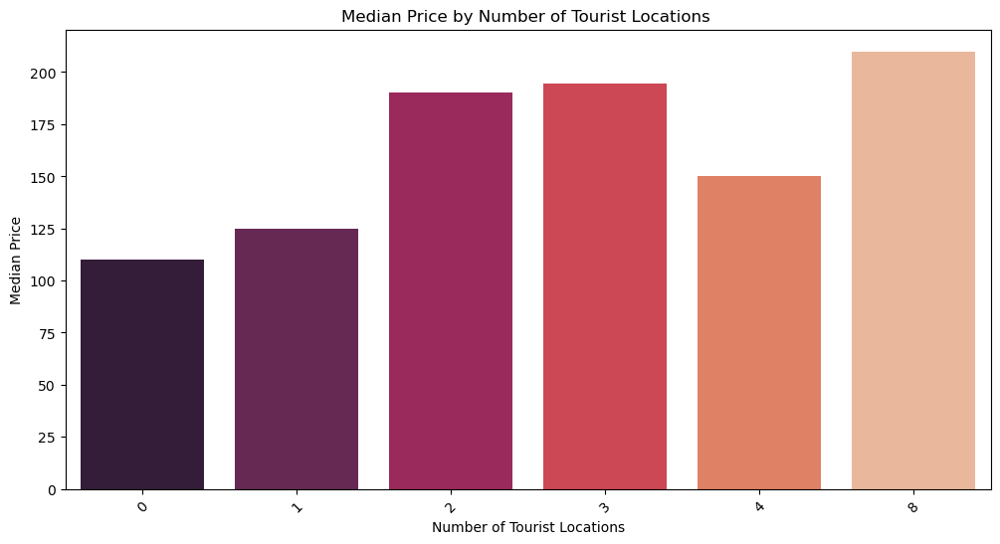

In [55]:
median_prices = mydata.groupby('Tourist Location')['price'].median().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='Tourist Location', y='price', data=median_prices, palette='rocket')
plt.title('Median Price by Number of Tourist Locations ')
plt.xlabel('Number of Tourist Locations')
plt.ylabel('Median Price')
plt.xticks(rotation=45)
plt.show()

We draw the following inferences:

- The airbnbs with the highest number of tourist locations nearby have the highest median price.
- The lowest median price is for airbnbs having no tourist location in the same neighbourhood.
- When we assess the overall trend in the median prices according to the number of tourist locations, we find that there is an increasing trend of median prices with an increase in the number of tourist locations, except for locations where there are 4 tourist locations nearby (this is an exception). 

### 4.5.2 Median prices by the number of parks in the neighbourhood

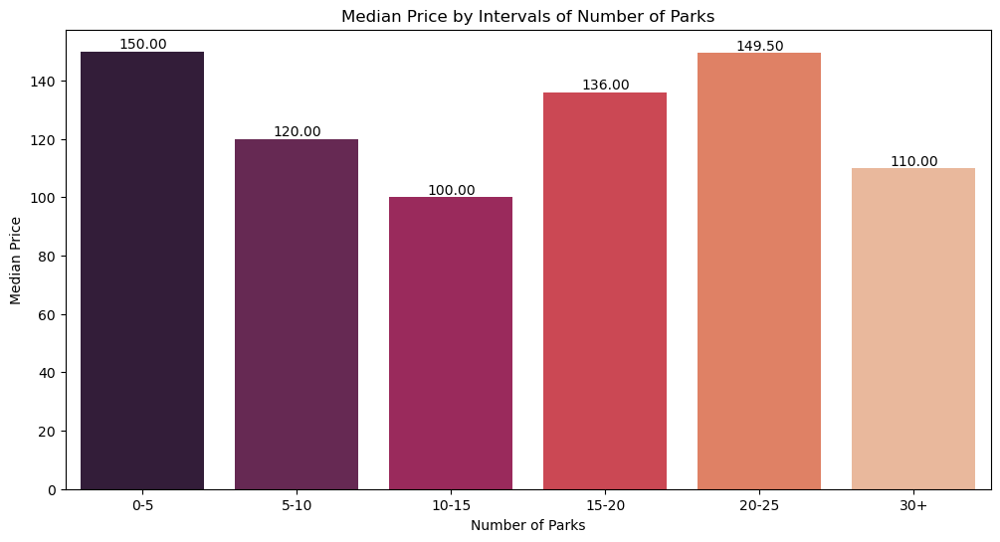

In [56]:
mydata['NumberofParks'] = mydata['NumberofParks'].astype(int)

max_parks = max(mydata['NumberofParks'])
interval_labels = [f"{i}-{i+5}" if i + 5 < 30 else "30+" for i in range(0, 30, 5)]
mydata['location_interval'] = pd.cut(mydata['NumberofParks'], bins=[i for i in range(0, 31, 5)],
                                      labels=interval_labels, include_lowest=False)

median_prices = mydata.groupby('location_interval')['price'].median().reset_index()

plt.figure(figsize=(12, 6))
mybar = sns.barplot(x='location_interval', y='price', data=median_prices, palette='rocket')
plt.title('Median Price by Intervals of Number of Parks')
plt.xlabel('Number of Parks')
for p in mybar.patches:
    mybar.annotate(f'{p.get_height():.2f}', (p.get_x()+p.get_width()/2, p.get_height()), 
                   ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.ylabel('Median Price')
plt.show()

This graph shows the median price for each interval of number of parks and we make the following inferences:

*   The airbnbs having only 0-5 parks in the neighbourhood have the highest median price, but barely higher than those in neighbourhoods with 20-25 parks.
*   The lowest median price is for airbnbs having 10-15 parks in the neighbourhood.
*   On assessing the overall pattern in the median prices according to the number of tourist locations, we find that no general trend is observed, althought it is clear that there exist differences in median prices a difference in the number of nearby parks.

### 4.5.3 Median prices of the different room types by the number of parks in the neighbourhood¶

In [57]:
max_parks = max(mydata['NumberofParks'])
interval_labels = [f"{i}-{i+5}" if i + 5 < 30 else "30+" for i in range(0, 30, 5)]
mydata['location_interval'] = pd.cut(mydata['NumberofParks'], bins=[i for i in range(0, 31, 5)],
                                      labels=interval_labels, include_lowest=False)

In [58]:
median_prices = mydata.groupby(['location_interval', 'room_type'], as_index=False)['price'].median()
rocket_colors = ['#35193e', '#701f57', '#ad1759','#e13342']

fig = go.Figure()
color_scale = ['#35193e', '#701f57', '#ad1759', '#e13342', '#f37651', '#f6b48f']
room_types = ['Entire home/apt', 'Private room', 'Shared room','Hotel room']
for i, room_type in enumerate(room_types):
    room_type_data = median_prices[median_prices['room_type'] == room_type].dropna(subset=['price'])
    fig.add_trace(go.Scatter(x=room_type_data['location_interval'],y=room_type_data['price'],mode='markers',name=room_type,
    marker=dict(size=room_type_data['price'] * 0.004, sizemode='diameter', sizeref=0.008, opacity=0.5, color=rocket_colors[i])))

fig.update_layout(title='Median Price by Number of Parks Intervals for each room type', title_x=0.5,
                  xaxis_title='Number of Parks Intervals', yaxis_title='Median Price')

buttons = [dict(label=room_type, method='update', args=[{'visible': [room_type == r for r in room_types]}])
           for room_type in room_types]
fig.update_layout(updatemenus=[{'active': 0, 'buttons': buttons, 'type': 'dropdown'}])

fig.show()

Upon clicking the buttons to see the different plots, we make the following inferences:

- Price for hotel rooms increase with increase in the number of parks except for hotel rooms having 5-10 parks nearby.
- There is no overall trend in the median price for remaining room types i.e, Entire home/apt, Shared room, private room, althought it is clear that there are stark differences in median prices for each room types with a difference in the number of nearby parks.

### 4.5.4 Median Prices by the minimum number of nights

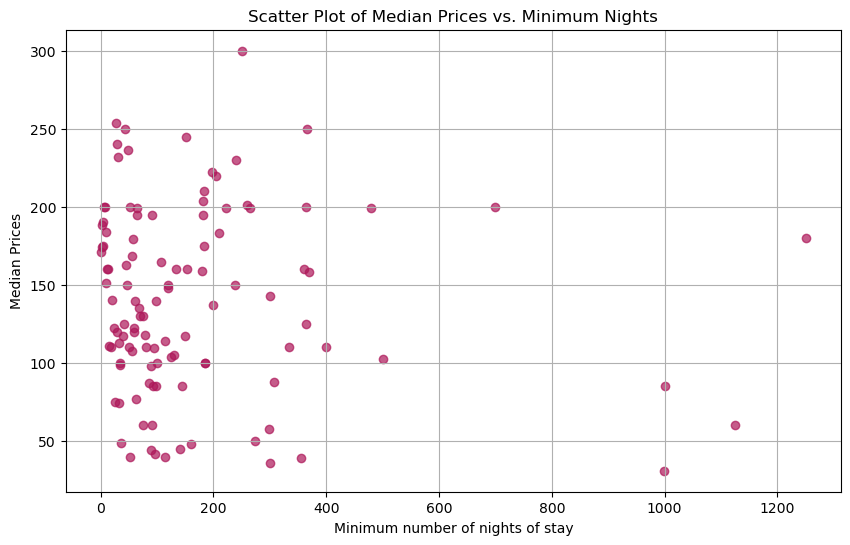

In [59]:
plt.figure(figsize=(10, 6))
med_min = mydata.groupby('minimum_nights')['price'].median().reset_index()

plt.scatter(med_min['minimum_nights'], med_min['price'], color='#ad1759', alpha=0.7)
plt.title('Scatter Plot of Median Prices vs. Minimum Nights')
plt.xlabel('Minimum number of nights of stay')
plt.ylabel('Median Prices')
plt.grid(True)
plt.show()

There seems to be no trend in the cost of stay vs minimum number of nights of stay at an Airbnb in New York City.

### 4.5.5 Checking for Median Prices against the availability of the Airbnb through the year

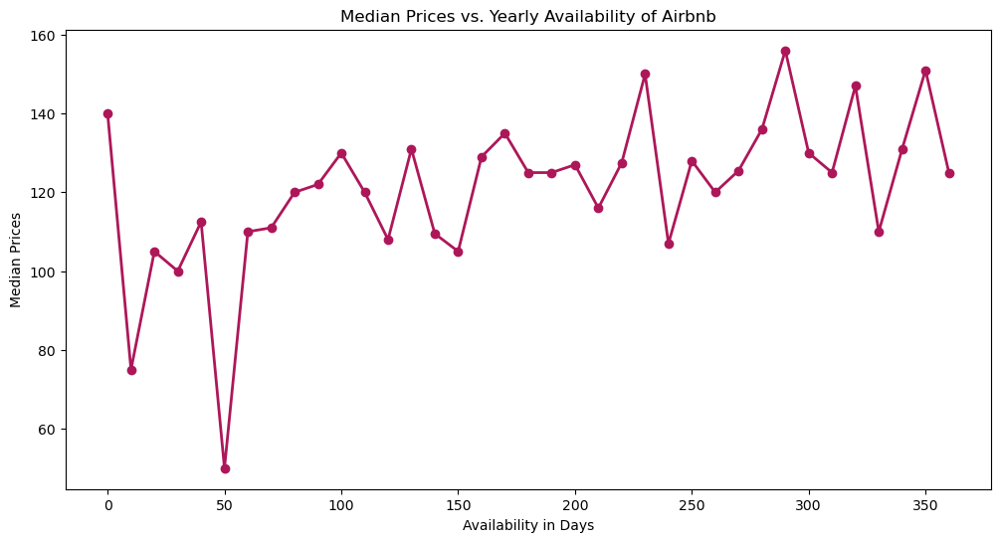

In [60]:
mydata['availability_bucket'] = pd.cut(mydata['availability_365'], bins=np.arange(0, 400, 10), right=False)
median_prices = mydata.groupby('availability_bucket')['price'].median().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(median_prices['availability_bucket'].apply(lambda x: x.left), median_prices['price'], marker='o', color='#ad1759', linestyle='-', linewidth=2, label='Median Prices')
plt.title('Median Prices vs. Yearly Availability of Airbnb')
plt.xlabel('Availability in Days')
plt.ylabel('Median Prices')
plt.show()

Yet again, although there are differences in the median prices of an Airbnb with its availability in days, there seems to be no clear trend in the median cost and availability of an Airbnb in New York City. There does seem to be a slight overall increase in median prices with 60 days or higher availability, but we need to be cautious with this interpretation.

## 4.6 Investigating Reviews

In [61]:
reviewsdata = mydata[['latitude','longitude','neighbourhood_group','price','number_of_reviews','number_of_reviews_ltm']]
reviewsdata.describe()

,latitude,longitude,price,number_of_reviews,number_of_reviews_ltm
count,38337.000000,38337.000000,38337.000000,38337.000000,38337.000000
mean,40.729061,-73.945265,147.592861,25.658711,5.939667
std,0.056811,0.054756,93.294284,58.736446,16.618657
min,40.500314,-74.251907,10.000000,0.000000,0.000000
25%,40.688540,-73.982194,77.000000,0.000000,0.000000
50%,40.725930,-73.953390,129.000000,4.000000,0.000000
75%,40.762790,-73.925720,198.000000,23.000000,4.000000
max,40.911380,-73.713650,561.000000,1865.000000,1075.000000


### 4.6.1 Mapping the number of reviews of Airbnbs in NYC

Since the number of reviews seem to be heavily unbalanced, we make buckets to only look at those Airbnbs which have 10 or more reviews overall.

In [62]:
reviewsdata = reviewsdata[reviewsdata['number_of_reviews'] >= 10]

In [63]:
reviewsdata.describe()

,latitude,longitude,price,number_of_reviews,number_of_reviews_ltm
count,14239.000000,14239.000000,14239.000000,14239.000000,14239.000000
mean,40.723864,-73.937926,145.388932,65.784465,14.843318
std,0.060957,0.060837,86.642065,81.954414,24.765830
min,40.500314,-74.249840,10.000000,10.000000,0.000000
25%,40.682170,-73.978303,83.000000,18.000000,0.000000
50%,40.716980,-73.947920,125.000000,37.000000,8.000000
75%,40.762045,-73.917475,188.500000,81.000000,23.000000
max,40.908840,-73.713650,560.000000,1865.000000,1075.000000


In [64]:
fig = px.scatter_mapbox(reviewsdata, lat='latitude', lon='longitude', color='number_of_reviews', mapbox_style='carto-positron',
                        zoom=11, title='Distribution of Property Types', text= reviewsdata['neighbourhood_group'])

fig.update_layout(mapbox_layers=[{'sourcetype': 'geojson', 'source': 'Borough Boundaries.geojson',
                                  'type': 'line', 'color': 'black', 'line': {'width': 1}, 'opacity': 0.9,},],
                  legend=dict(traceorder='reversed'),  title_x = 0.45)
fig.show()

Clearly, most of the Airbnbs in NYC seem to have less than 500 reviews; we can see some listings in Manhattan that have more than 1000 reviews.

### 4.6.2 Checking the number of reviews of Airbnbs in NYC

Let us check the values of the maximum number of reviews in each of the neighbourhoods.

In [65]:
max_rev = reviewsdata.groupby('neighbourhood_group')['number_of_reviews'].max().reset_index()
max_rev

,neighbourhood_group,number_of_reviews
0,Bronx,461
1,Brooklyn,644
2,Manhattan,1865
3,Queens,664
4,Staten Island,338


Manhattan has the highest maximum number of reviews among all the boroughs, with 1865 reviews. We can infer:
- Properties in Manhattan seem to be more popular or have garnered more attention from guests, as indicated by the higher number of reviews.
- The higher number of reviews in Manhattan could be a reflection of higher demand for accommodations in this borough. This is due to it having the most number of listings and tourist locations, as we already observed before. Thus, there is a higher chance of extreme values that might be influencing the maximum review counts in this borough.

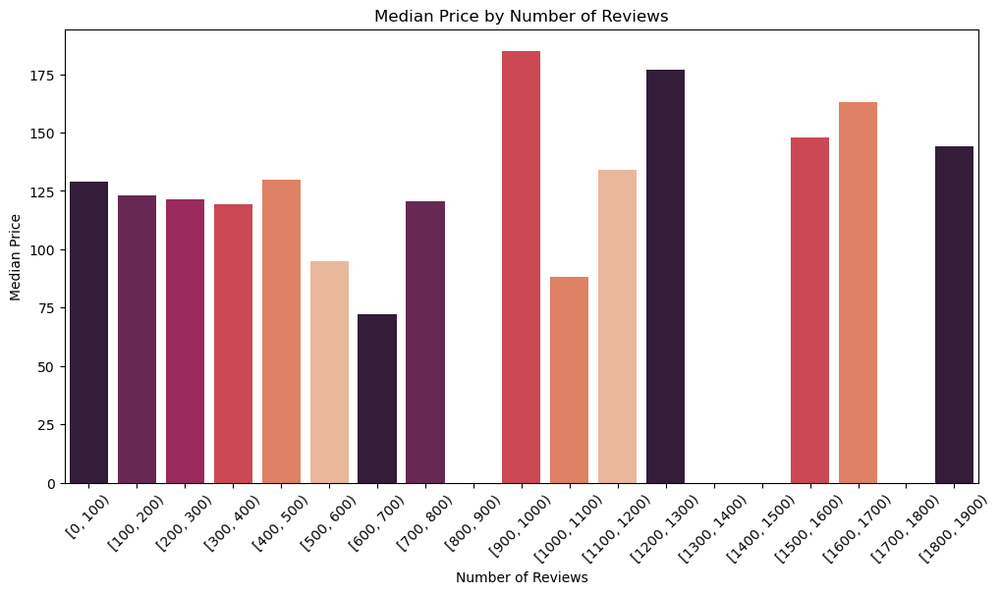

In [66]:
reviewsdata['review_buckets'] = pd.cut(reviewsdata['number_of_reviews'], bins=np.arange(0, 2000, 100), right=False)
median_prices = reviewsdata.groupby('review_buckets')['price'].median().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='review_buckets', y='price', data=median_prices, palette=palette)
plt.title('Median Price by Number of Reviews')
plt.xlabel('Number of Reviews')
plt.ylabel('Median Price')
plt.xticks(rotation=45)
plt.show()

As we noticed, all properties with more than 1000 reviews are in Manhattan, and Manhattan also generally has higher median prices. In the plot too, we see that the properties with more than 1000 reviews mostly have a higher median price than those with less than 1000 reviews. Although there clearly are differences in price with number of reviews, there doesn't appear to be any consistent pattern of increase or decrease in price with number of reviews.

### 4.6.2 Checking the number of reviews of Airbnbs in NYC in the last 12 months

In [67]:
max_rev = mydata.groupby('neighbourhood_group')['number_of_reviews_ltm'].max().reset_index()
max_rev

,neighbourhood_group,number_of_reviews_ltm
0,Bronx,82
1,Brooklyn,146
2,Manhattan,1075
3,Queens,179
4,Staten Island,117


Again, Manhattan has the highest number of reviews in New York City even when we see reviews for the last 12 months only. In none of the other boroughs does the maximum number of reviews cross 200.

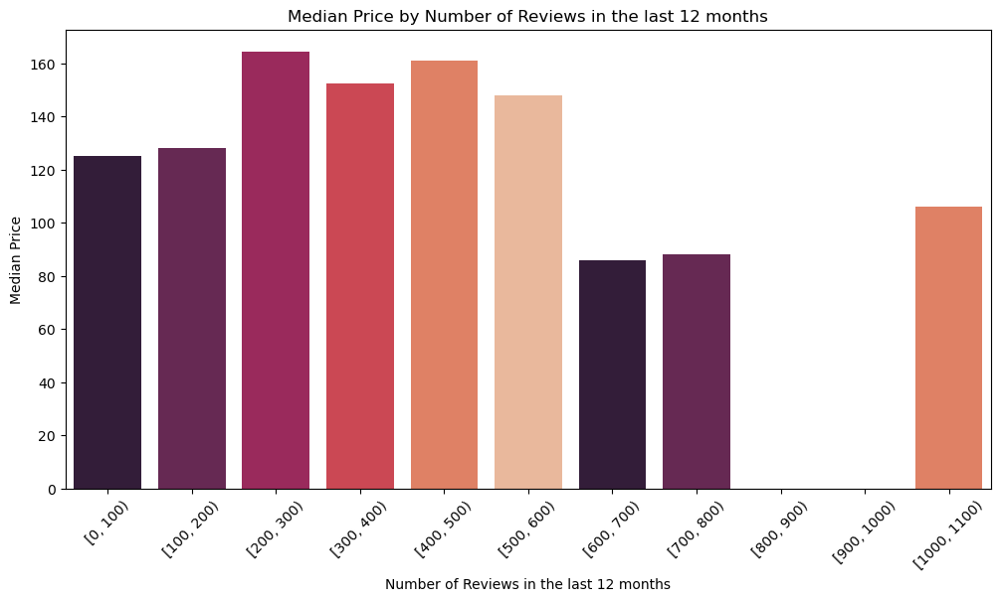

In [68]:
reviewsdata['review_buckets'] = pd.cut(reviewsdata['number_of_reviews_ltm'], bins=np.arange(0, 1200, 100), right=False)
median_prices = reviewsdata.groupby('review_buckets')['price'].median().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='review_buckets', y='price', data=median_prices, palette=palette)
plt.title('Median Price by Number of Reviews in the last 12 months')
plt.xlabel('Number of Reviews in the last 12 months')
plt.ylabel('Median Price')
plt.xticks(rotation=45)
plt.show()

Although there clearly are differences in price with number of reviews, there doesn't appear to be any clear pattern of increase or decrease in price with number of reviews - this is consistent with our earlier observation with the overall number of reviews of Airbnb listings.

## 4.7 Investigating the names of Airbnbs to find wording patterns

First we want to look into those boroughs which have majority of listings, namely Manhattan and Brooklyn which contribute to 80% of all listings in New York City.

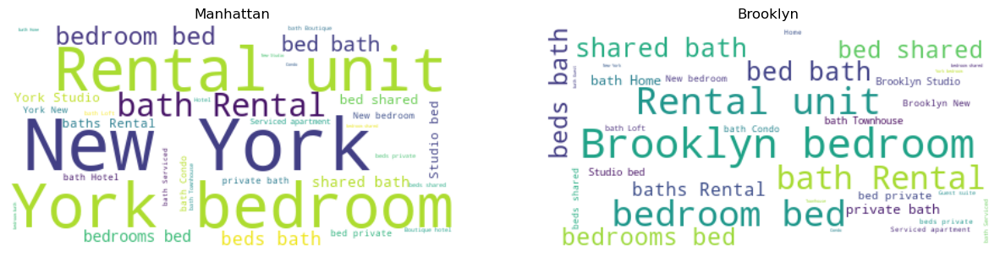

In [69]:
from wordcloud import WordCloud

ManhattanData = mydata[mydata['neighbourhood_group']== 'Manhattan']
BrooklynData = mydata[mydata['neighbourhood_group']=='Brooklyn']

blist = [ManhattanData, BrooklynData]
boroughs = ['Manhattan', 'Brooklyn']

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

for ax, data, borough in zip(axes, blist, boroughs):
    text = data['name'].astype(str).apply(lambda x: x + ' ').str.cat()
    wordcloud = WordCloud(width=400, height=200, max_words=50, background_color='white').generate(text)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(borough)

plt.show()

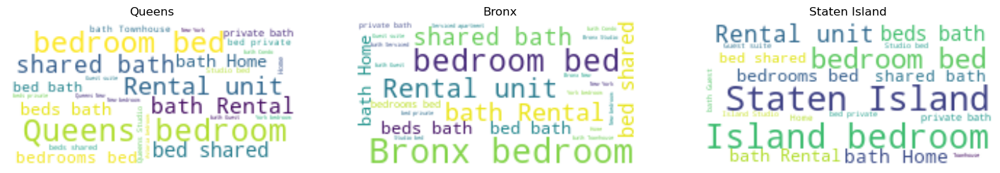

In [70]:
QueensData = mydata[mydata['neighbourhood_group']=='Queens']
BronxData = mydata[mydata['neighbourhood_group']=='Bronx']
StatenData = mydata[mydata['neighbourhood_group']=='Staten Island']

blist2 = [QueensData, BronxData, StatenData]
boroughs2 = ['Queens', 'Bronx','Staten Island']

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 10))

for ax, data, borough in zip(axes, blist2, boroughs2):
    text = data['name'].astype(str).apply(lambda x: x + ' ').str.cat()
    wordcloud = WordCloud(width=200, height=100, max_words=50, background_color='white').generate(text)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(borough)

plt.show()

We notice the following:
- Manhattan includes the words "New York" in its Airbnb names, but the other boroughs mostly seem to include the name of the borough in the Airbnb name. The general wording pattern for these 4 boroughs seems to be: "(Borough name) bedroom"
- This suggests that properties in Manhattan may use the broader location identifier "New York" to appeal to a wider audience, given the global recognition of Manhattan as part of New York City. For the remaining boroughs, the wording pattern indicates a more localized and borough-specific approach, emphasizing the borough name directly in the property listings.

# 5. Data Modeling - Predicting Price Groups

### 5.1 Aim

We want to predict prices of Airbnbs in New York City using the various features in our dataset, to categorize them into either a high priced or low priced group. We do so by taking the median Airbnb price in the city as a threshold to divide them into 2 groups.

In [71]:
med = mydata['price'].median()
med

129.0

The median is $129 which we take as our threshold to classify prices into a high price group (>129 dollars) and a low price group (<129 dollars). This threshold makes sense because as we saw in the plot of the distribution of Airbnb prices in New York City, a majority of the listings priced between 50 to 100 dollars and fewer over 200 dollars. Most customers on a budget would aim to book an Airbnb that costs below 129 dollars per night.

In [72]:
def categorize_price(price):
    if price < med:
        return 'Less Price'
    else:
        return 'High Price'

mydata['price_category'] = mydata['price'].apply(categorize_price)

### Model Comparisons

First, in order to decide on an appropriate model, lets compare the working of various different models on our data.

In [83]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(mydata['price_category'])
mydata['price_category_encoded'] = y_encoded

Lets split our data into training and test sets.

In [84]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split

X = mydata[['room_type', 'latitude','longitude','neighbourhood','neighbourhood_group']]
y = mydata['price_category_encoded']

categorical_cols = ['room_type', 'neighbourhood_group','neighbourhood']

preprocessor = ColumnTransformer(transformers=[('cat', OneHotEncoder(), categorical_cols)])
X_processed = preprocessor.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.2, random_state=0)

In [85]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier

RANDOM_SEED = 0
classifiers = {
    "Logistic Regression": LogisticRegression(random_state=RANDOM_SEED, max_iter=1000),
    "Nearest Neighbour": KNeighborsClassifier(5),
    "Linear SVM": SVC(
        kernel="linear", C=0.025, probability=True, random_state=RANDOM_SEED
    ),
    "RBF SVM": SVC(probability=True, random_state=RANDOM_SEED),
    "Random Forest": RandomForestClassifier(
        max_depth=5, n_estimators=10, max_features=1, random_state=RANDOM_SEED
    ),
    "AdaBoost": AdaBoostClassifier(random_state=RANDOM_SEED),
}

In [86]:
for name, classifier in classifiers.items():
    classifier.fit(X_train, y_train)

In [87]:
y_hats = {}
p_hats = {}
for name, classifier in classifiers.items():
    y_hats[name] = classifier.predict(X_test)  # predicted labels
    p_hats[name] = classifier.predict_proba(X_test)[:, 1]  # predicted probabilties

In [88]:
from sklearn.metrics import confusion_matrix, accuracy_score

performance = {}
for name, y_pred in y_hats.items():
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()
    tpr = tp / (tp + fn)
    fpr = fp / (fp + tn)
    acc = accuracy_score(y_test, y_pred)
    performance[name] = [acc, tpr, fpr]

perf_df = pd.DataFrame.from_dict(
    performance, orient="index", columns=["Accuracy", "TPR", "FPR"]
)

In [89]:
with pd.option_context("display.float_format", "{:0.3f}".format):
    display(perf_df)

,Accuracy,TPR,FPR
Logistic Regression,0.813,0.775,0.151
Nearest Neighbour,0.753,0.820,0.313
Linear SVM,0.805,0.741,0.133
RBF SVM,0.823,0.770,0.125
Random Forest,0.585,0.216,0.053
AdaBoost,0.809,0.755,0.138


We are more concerned with having a better TPR (True Positive Rate) and also simultaneously a good accuracy. This is because properties which are high price but are classified as low price can have more signficant consequence for a customer that is booking the Airbnb on a budget. Therefore, we decide to use logistic regression as our modeling method.

### ROC Curve and AUC

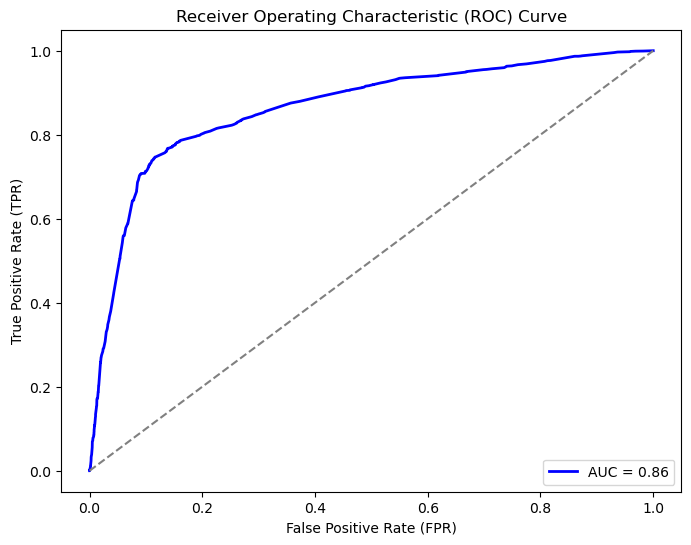

In [90]:
from sklearn.metrics import roc_curve, auc

model = LogisticRegression(solver='lbfgs')
model.fit(X_train, y_train)

y_pred = model.predict_proba(X_test)[:, 1]

fpr, tpr, _ = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In general, an AUC (area under the ROC curve) of 0.5 suggests random classification (i.e., no ability to classify prices into the required groups), 0.7 to 0.8 is considered acceptable, 0.8 to 0.9 is considered excellent, and more than 0.9 is considered outstanding. Since we have received an AUC of 0.86, this can be considered excellent and the curve indicates a high ability of our model to correctly classify price groups based on the features.

In [91]:
from sklearn.metrics import accuracy_score

threshold = 0.5

final_classes = (y_pred >= threshold).astype(int)
accuracy = accuracy_score(y_test, final_classes)

print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.81


Thus, the accuracy of our model is 81%.

In [92]:
from sklearn.metrics import confusion_matrix

mymatrix = confusion_matrix(y_test, final_classes)
confusion = pd.DataFrame(mymatrix)
confusion.rename(columns = {0:'High price',1:'Low price'}, index= {0:'High price',1:'Low price'})

,High price,Low price
High price,3290,584
Low price,853,2941


Thus, we have successfully built a model to categorize prices into high and low groups with 81% accuracy using logistic regression.  

# 6. Conclusion

Our project consisted of an investigation mainly into the factors that influence Airbnb prices in New York City and also looked into the trends or patterns of use when it comes to Airbnbs in this city. Our data had a number of features that are related to Airbnb properties themselves, such as the room type, minimum number of nights of stay, reviews, etc. Additionally, we included some extra features about the geography to draw deeper insights - these included the number of nearby tourist attractions and parks. Our analysis has provided us with valuable insights into the dynamics of NYC's Airbnb market.

<figure style="text-align: center;">
  <img src="SecondImage.jpeg" style="width:100%" alt="Image description">
  <figcaption>Image source: <a href="https://www.guesty.com/blog/steps-to-becoming-airbnb-superhost/">Guesty</a></figcaption>
</figure>

## 6.1 Answers to our specific research questions posed at the beginning

**How are the listings distributed in New York City across its various boroughs?**
- We discovered that a majority of Airbnb listings are concentrated in Manhattan and Brooklyn, accounting for approximately **80%** of all listings. Staten Island had the least number of listings, less than 1% of all of New York City's Airbnb listings.

**What is the distribution of prices of Airbnbs in New York City?**
- The distribution of prices indicates that a significant portion of listings falls within the 50-100 dollars range. 
- We also discovered that hotel rooms, despite being a smaller category, tend to be more expensive, revealing the pricing dynamics within the different different property types. Shared rooms tend to be the cheapest by median price; however, in Staten Island, the minimum price of shared rooms were much higher than the minimum prices of all other room types.

**What inferences can we make by plotting Airbnb listing types on a map, if any? Can any peculiar pattern be explained?**
- We note that almost all the Airbnb hotel rooms in the city are listed in Manhattan and that hotel rooms also are concentrated in the south side of Manhattan. Upon further investigation, we find evidence of our assumed reasoning for this pattern, which is that this could be due to the presence of a higher number of tourist spots in this area of Manhattan.
- Bronx and Staten Island have no hotel rooms at all.

**What are the overall median prices of Airbnbs in New York City's 5 boroughs without taking into consideration any features?**
- Manhattan has the highest median cost of booking an Airbnb (155.50 dollars) whereas Bronx has the lowest (89.00 dollars).

**What are the median prices of Airbnbs in New York City taking in account the different room types, nearby tourist locations, parks, reviews, etc. into consideration?**
1. Room Types: Hotel rooms, if they exist in the borough, have the highest median price; they also have a very high minimum price as compared to all the other room types. The second highest median price is that for an entire home or apartment for all boroughs except Staten Island, in which a shared room costs more.
2. Nearby tourist locations: Neighboring tourist locations generally influence higher prices.
3. Parks: The relationship of prices with the presence of nearby parks is less clear, although there are clear differences in average prices of listings with a difference in the number of nearby parks.
4. Annual Availability: Although there are differences in the median prices of an Airbnb with its availability in days, there seems to be no clear trend in the median cost and availability of an Airbnb in New York City, other than a slight overall increase in prices with an increase in availability.
5. Reviews: Manhattan has the highest maximum number of reviews among all the boroughs, and is also the only borough that contains listing with more than 1000 reviews. The higher number of reviews in Manhattan could be a reflection of higher demand for accommodations in this borough. This is due to it having the most number of listings and tourist locations, as we already observed before. 

**Which are the top 10 most expensive neighbourhoods in New York City? Which neighbourhood groups do they belong to?**
- Among the top 10 neighbourhoods which have the costliest Airbnb listings, 5 of them are in Manhattan, 2 in Brooklyn, 2 in Staten Island and 1 in Queens. Noho in Manhattan stands out as the most expensive.
- Bronx doesn't contain any of the top 10 costliest neighbourhoods.
- All of these 10 neighbourhoods have a median price greater than 250 dollars.

**Is there any pattern in the average pricing by the hosts that have the top 20 highest number of listings in the city?**
- Our research uncovered that from the top 20 hosts with the highest number of listings, a small number of hosts dominate the Airbnb market, with those managing more properties generally offering lower average prices. 

**What are the patterns in Airbnb names, if any?**
- The Airbnbs in Manhattan include the words "New York" in thier names, but the Airbnbs in other boroughs mostly seem to include the name of the borough in the property name. The general wording pattern for these 4 boroughs seems to be: "(Borough name) bedroom". This suggests that properties in Manhattan may use the broader location identifier "New York" to appeal to a wider audience, especially being the borough which has the most number of Airbnb listings in the city.

**We also wanted to predict Airbnb prices into 2 classes: a higher cost category, and a lower cost category, using an appropriate data modeling technique.**
- We successfully built a model to categorize prices into high priced and low priced groups with 81% accuracy, using logistic regression. The AUC was 0.86, which is indicative of the high ability of our model to correctly classify price groups based on the features.

## 6.2 Critical Analysis

The research methodology employed, combining exploratory data analysis, visualizations, and statistical techniques, provides a comprehensive view of the Airbnb market in New York City. The findings emphasize the importance of considering various factors, including location, property type, host behavior and the presence of nearby tourist locations, in understanding pricing dynamics. We can make the following final comments:

- We discover that Manhattan, which has the highest number of listings in the city, also has the highest overall median price of Airbnbs. This finding underscores the correlation between price and demand, with Manhattan possibly attracting higher prices due to elevated demand. The identification of the top 20 most expensive neighborhoods also revealed a concentration of high-priced areas in Manhattan.
- For all the boroughs, entire homes/apartments and private rooms are the most widely listed. It is interesting that listings of hotel rooms are the least in all the boroughs. This could be because Airbnb recently opened up the possibility of listing hotel rooms in the site; our finding suggests that most hotel owners are still apprehensive to list their property on Airbnb. 
- Our finding that the majority of the listed Airbnb properties being owned by a small number of hosts is indicative of a potential strategy by hosts with multiple listings to offer many budget friendly options.
- Our analysis indicates a correlation between higher-priced listings and proximity to tourist locations emphasizing the importance of easy accessibility and proximity to these attractions for Airbnb users. The relationship with parks is less clear, although there are clear differences in average prices of listings with a difference in the number of nearby parks. This emphasizes the nuanced impact of specific factors on Airbnb prices.

Our project successfully addressed our initial research questions, revealing not only distribution and pricing patterns but also shedding light on host strategies and the impact of specific geographic features on Airbnbs.

## 6.3 Final Remarks

In conclusion, the analysis of Airbnb prices in New York City contributes valuable insights for both hosts and travellers in New York City. The concentration of listings in key boroughs, coupled with nuanced pricing patterns, highlights the dynamic nature of Airbnbs in the city. 

Hosts can leverage these insights to optimize pricing strategies while travellers can gain a better understanding of the factors influencing Airbnb costs, so that they can find something that suits their budget. 

Our findings also contribute to the broader discourse on the sharing economy, emphasizing the need for data-driven approaches in understanding and navigating the evolving landscape of short-term rentals like Airbnb.